## Brief description of the problem and data (5 pts)

- Generate Monet-style graphs from general photos with GAN.


- GAN consist of at least two neural networks: a generator model and a discriminator model. For this competition, we should generate images in the style of Monet. The generator is trained using the discriminator.

- The two models will play against each other, with the generator trying to fool the discriminator, and the discriminator trying to accurately classify real images from generated images.

- All the images for the competition are already sized to 256 x 256. As these images are RGB images, set the channel to 3.

In [1]:
import warnings
warnings.filterwarnings('ignore')

from keras.models import Model
from keras import layers
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
import os
import numpy as np
import random
from imageio import imread

Using TensorFlow backend.


In [2]:
def print_random(df,examples):
    plt.figure(figsize = (14, 14))
    for i in range(0, examples):
        plt.subplot(1, examples, i + 1)
        idx = random.randint(0, len(df) - 1)
        x_img = imread(df[idx])
        plt.axis("off")
        plt.imshow(x_img)
    plt.show()

def print_random_RGB(df,example):
    for i in range(example):
        idx = random.randint(0, len(df) - 1)
        img = imread(df[idx])

        plt.figure(figsize=(16, 2))
        plt.subplot(1, 4, 1)
        plt.axis("off")
        plt.imshow(img)
        custom_colors = ["red", "green","blue"]
        for i,color_set in zip(range(0, 3),custom_colors):
            plt.subplot(1, 4, i + 2)
            color_layer = img[:, :, i]
            #plt.axis("off")
            plt.hist(color_layer.reshape(-1),bins=128,color =color_set)

## Exploratory data analysis(EDA)
- Check Image Size
- Show Image Samples
- Check how the range of RGB is distributed

Monet shape: (256, 256, 3)
Number of Monet data: 300


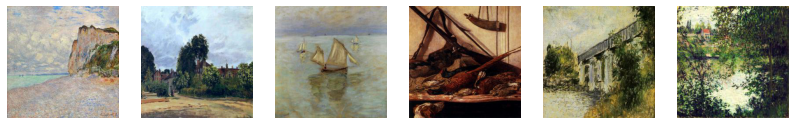

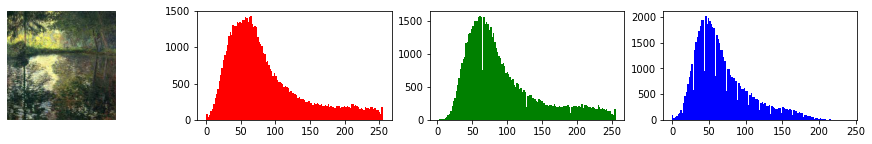

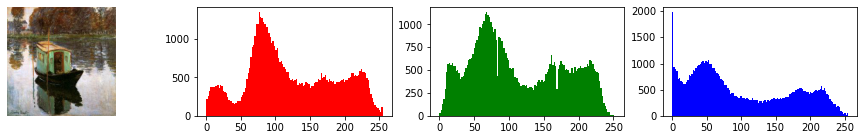

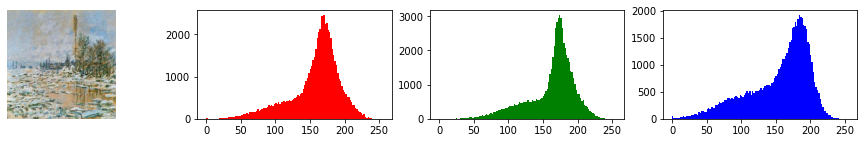

In [3]:
x_train = []
x_path = 'monet_jpg/'
for fname in os.listdir(x_path):
    img_path = os.path.join(x_path, fname)
    if not fname.startswith("."):
        x_train.append(img_path)
        
i = random.randint(0, len(x_train) - 1)
x_img = imread(x_train[i])
print("Monet shape:", x_img.shape)
print("Number of Monet data:", len(x_train))

print_random(x_train,6)
print_random_RGB(x_train,3)

Photo shape: (256, 256, 3)
Number of Photo data: 300


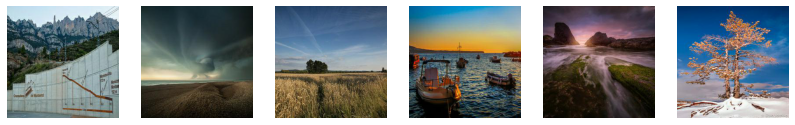

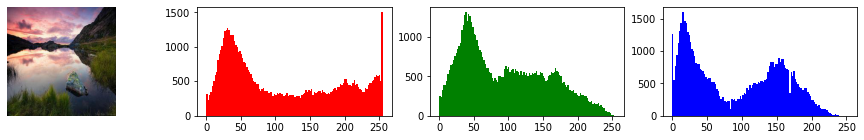

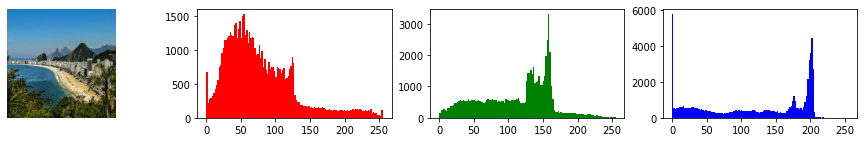

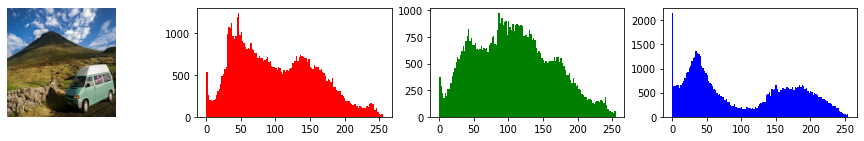

In [4]:
x_test = []
x_path = 'photo_jpg/'
# 走過A 分類(梵谷) 的所有照片
for fname in os.listdir(x_path):
    img_path = os.path.join(x_path, fname)
    if not fname.startswith("."):
        x_test.append(img_path)
i = random.randint(0, len(x_test) - 1)
x_img = imread(x_test[i])

print("Photo shape:", x_img.shape)
print("Number of Photo data:", len(x_train))
print_random(x_test,6)
print_random_RGB(x_test,3)

## Model Architecture

### Discriminator
- Full convolution: For pictures, full convolution can correctly capture the hidden features of the picture
- Batch Normalization :Each layer has moderate scaling and translation, which can well match the initial weight
- LeakyRelu:We often choose relu as the activation function, but relu will change the slope to 0. This means that the neuron is dead. This will be a disaster in GAN. The improved method here is to use leakyrelu instead, so that the slope of the negative zone is not 0, but a very small value.
- Learning rate = 0.0002 can get the best result that I've tried.

In [5]:
lr_setting = {
            'generator':{'lr':0.0002},
            'discriminator':{'lr':0.0002},
            } 


In [6]:
def build_discriminator():

    def d_layer(layer_input, filters, f_size=(4, 4)):
        d = layers.Conv2D(filters, kernel_size=f_size, strides=2,
                   padding='same')(layer_input)
        d = layers.LeakyReLU(alpha=0.2)(d)
        d = layers.BatchNormalization()(d)
        #d = InstanceNormalization()(d)
        return d

    img = layers.Input(shape=(256, 256, 3))
    d1 = d_layer(img, 32)
    d2 = d_layer(d1, 64)
    d3 = d_layer(d2, 128)
    d4 = d_layer(d3, 256)
    d5 = d_layer(d4, 1)
    d6 = layers.Flatten()(d5)
    validity =layers. Dense(1, activation="sigmoid")(d6)
    return Model(img, validity)

discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(lr_setting['discriminator']['lr']))
discriminator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      1568      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 128, 128, 32)      0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 128, 128, 32)      128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)        32832     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 64)        256       
__________

### Generator
- Full convolution: For pictures, full convolution can correctly capture the hidden features of the picture
- Batch Normalization :Each layer has moderate scaling and translation, which can well match the initial weight
- LeakyRelu:We often choose relu as the activation function, but relu will change the slope to 0. This means that the neuron is dead. This will be a disaster in GAN. The improved method here is to use leakyrelu instead, so that the slope of the negative zone is not 0, but a very small value.
- Learning rate = 0.0002 can get the best result that I've tried.

In [7]:
def build_generator():
    def conv2d(layer_input, filters):
        d = layers.Conv2D(filters, kernel_size=(4, 4), strides=2,
                   padding='same')(layer_input)
        d = layers.LeakyReLU(alpha=0.2)(d)
        return d

    def deconv2d(layer_input, filters):
        u = layers.Conv2DTranspose(filters, 4, strides=2, padding='same')(layer_input)
        u = layers.Conv2D(filters, kernel_size=5,padding='same')(u)
        u = layers.LeakyReLU(alpha=0.2)(u)
        return u

    d0 = layers.Input(shape=(256, 256, 3))
    d1 = conv2d(d0, 8*4)
    d2 = conv2d(d1, 16*4)
    d3 = conv2d(d2, 32*4)
    d4 = conv2d(d3, 64*4)
    #d5 = conv2d(d4, 128*4)
    
    #u0 = deconv2d(d5, d4,64*4)
    u1 = deconv2d(d4, 32*4)
    u2 = deconv2d(u1, 16*4)
    u3 = deconv2d(u2, 8*4)
    u4 = deconv2d(u3, 3)
    output_img = layers.Conv2D(3, 7, activation='sigmoid', padding='same')(u4)
    return Model(d0, output_img)


generator = build_generator()
generator.compile(loss='mse', optimizer=Adam(lr_setting['generator']['lr']))
generator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 128, 128, 32)      1568      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 128, 128, 32)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 64)        32832     
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 32, 32, 128)       131200    
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 128)       0         
__________

In [8]:
discriminator.trainable = False
gan_input = layers.Input(shape=(256, 256, 3))
x = generator(gan_input)
gan_output = discriminator(x)
gan = Model(inputs=gan_input, outputs=gan_output)
gan.compile(loss='binary_crossentropy', optimizer=Adam(lr_setting['generator']['lr']))
gan.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
model_2 (Model)              (None, 256, 256, 3)       1918531   
_________________________________________________________________
model_1 (Model)              (None, 1)                 696230    
Total params: 2,614,761
Trainable params: 1,918,531
Non-trainable params: 696,230
_________________________________________________________________


In [9]:
def random_get_data(batch_size=100,target = x_train):
    idx = np.random.randint(0, len(target), batch_size)
    imgs = []
    for i in idx:
            imgs.append((imread(target[i])/255))
    imgs = np.array(imgs)
    valid = np.ones((batch_size, 1)) 
    fake = np.zeros((batch_size, 1)) 
    
    return  imgs,valid,fake

In [10]:
def print_test_result(generator,batch_size=10):
    # Rescale images 0 - 1
    imgs,valid,fake = random_get_data(batch_size=batch_size,target = x_test)
    gen_imgs = generator.predict(imgs)
    examples = len(gen_imgs)
    #gen_imgs = gen_imgs.reshape(examples, 28, 28)
    
    plt.figure(figsize = (14, 14))
    for i in range(0, examples):
        plt.axis("off")
        plt.subplot(1, examples, i + 1)
        plt.axis("off")
        plt.imshow((imgs[i]*255).astype(int))
        plt.axis("off")
    plt.axis("off")
    plt.show()
    
    plt.figure(figsize = (14, 14))
    for i in range(0, examples):
        plt.axis("off")
        plt.subplot(1, examples, i + 1)
        plt.axis("off")
        plt.imshow((gen_imgs[i]*255).astype(int))
        plt.axis("off")
    plt.axis("off")
    plt.show()

--------------- epoch 199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.057816602289676666
Generator lr 0.0002 loss: 0.5546109


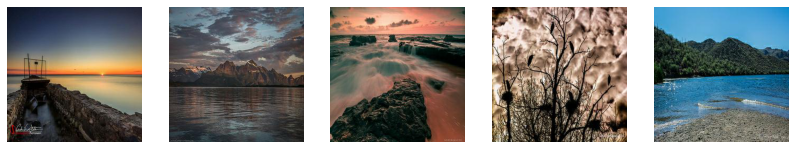

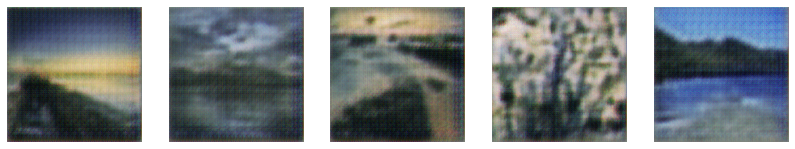

--------------- epoch 399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.07670466601848602
Generator lr 0.0002 loss: 1.0517656


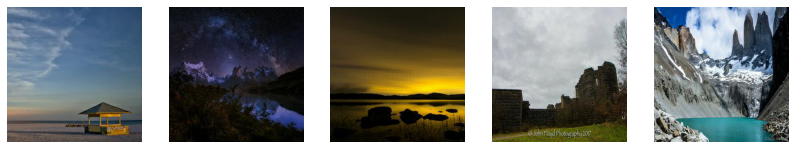

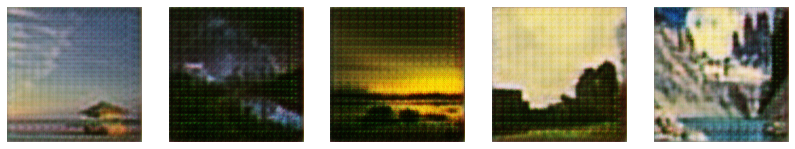

--------------- epoch 599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.06288085132837296
Generator lr 0.0002 loss: 1.3440418


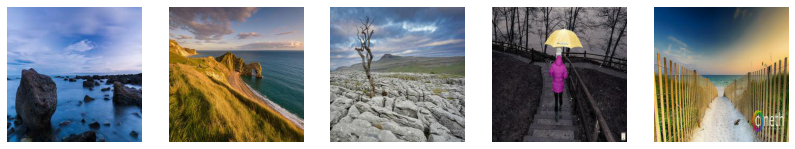

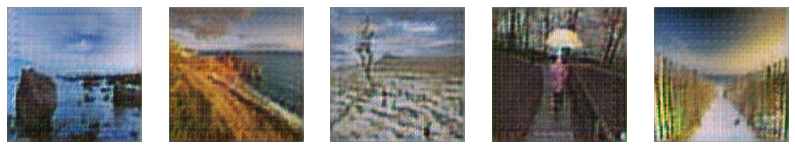

--------------- epoch 799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.020993411540985107
Generator lr 0.0002 loss: 4.4871416


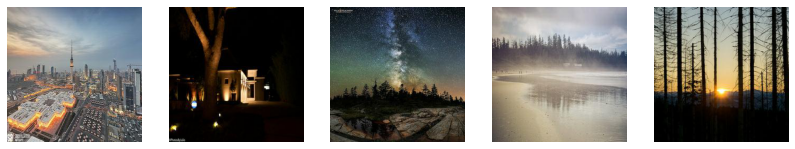

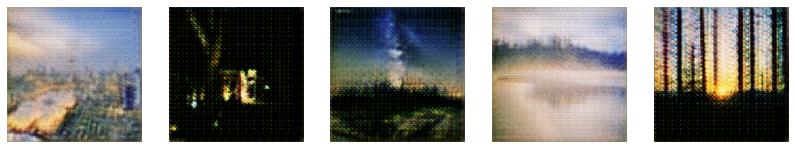

--------------- epoch 999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.014405074529349804
Generator lr 0.0002 loss: 3.9492862


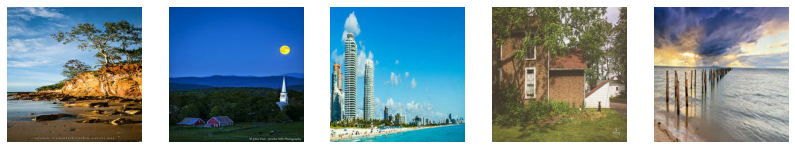

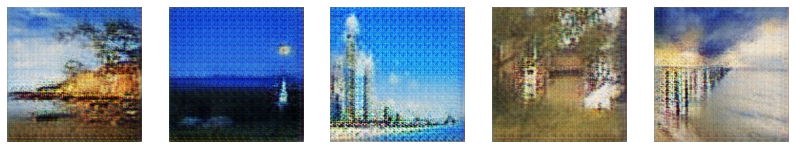

--------------- epoch 1199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.2016051709651947
Generator lr 0.0002 loss: 1.3910881


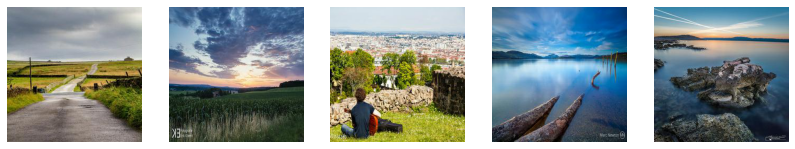

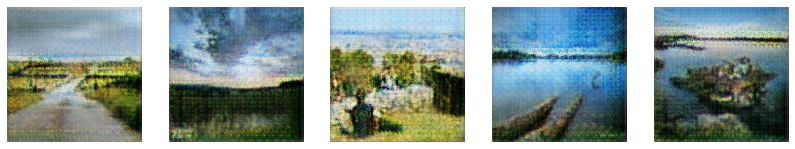

--------------- epoch 1399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.00505999056622386
Generator lr 0.0002 loss: 2.2587385


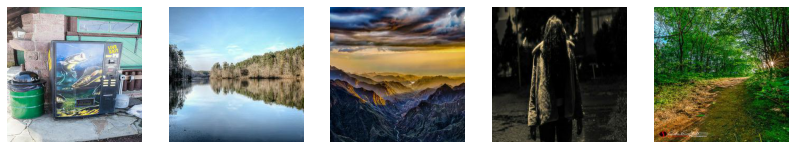

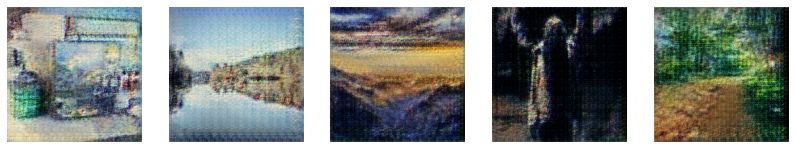

--------------- epoch 1599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.05376401171088219
Generator lr 0.0002 loss: 3.2852163


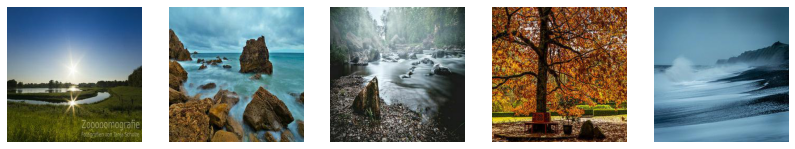

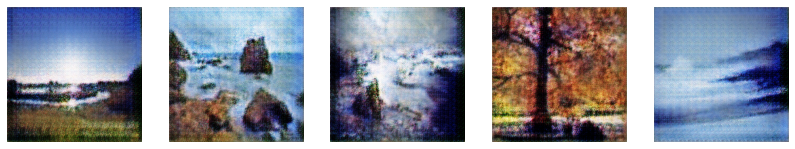

--------------- epoch 1799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.06538102775812149
Generator lr 0.0002 loss: 1.4890122


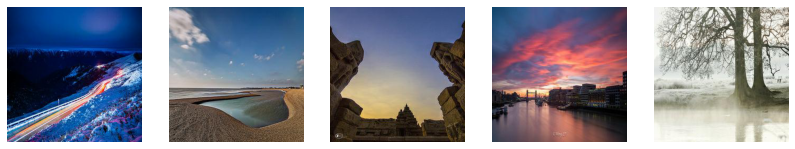

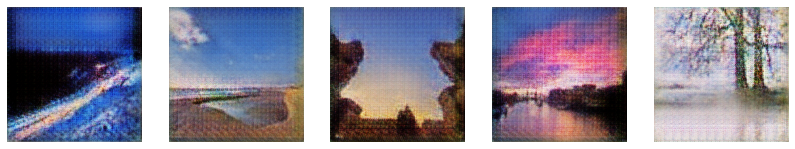

--------------- epoch 1999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.05587872490286827
Generator lr 0.0002 loss: 2.0411568


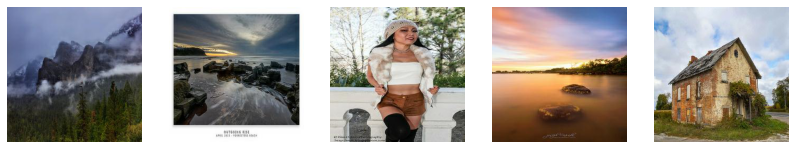

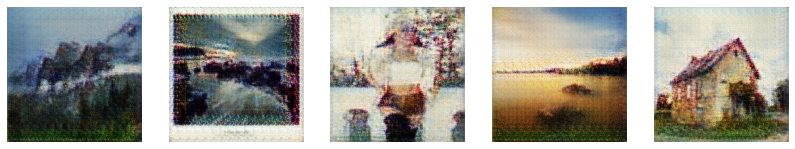

--------------- epoch 2199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.006047757342457771
Generator lr 0.0002 loss: 0.5236796


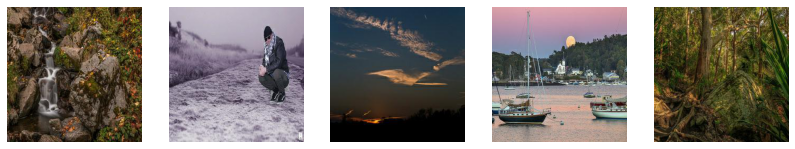

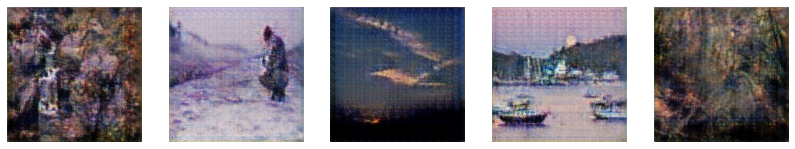

--------------- epoch 2399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.05575880780816078
Generator lr 0.0002 loss: 3.7044778


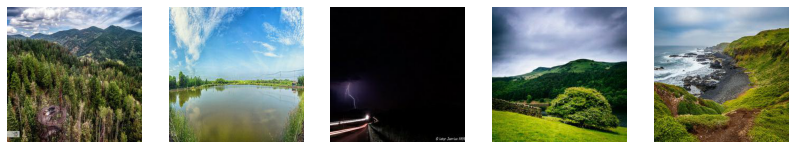

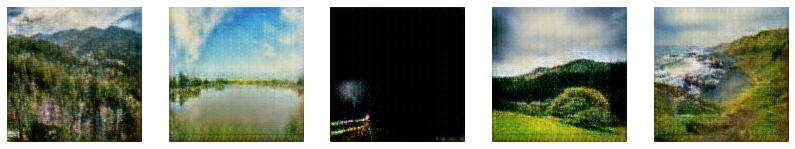

--------------- epoch 2599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.00891841109842062
Generator lr 0.0002 loss: 1.1700178


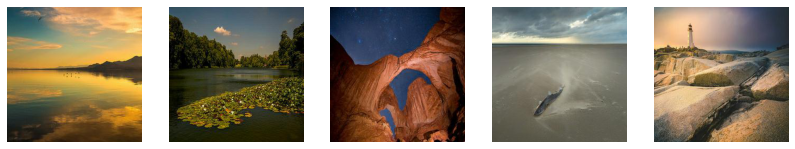

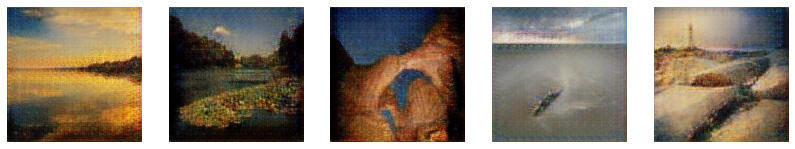

--------------- epoch 2799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.09652354568243027
Generator lr 0.0002 loss: 3.6918511


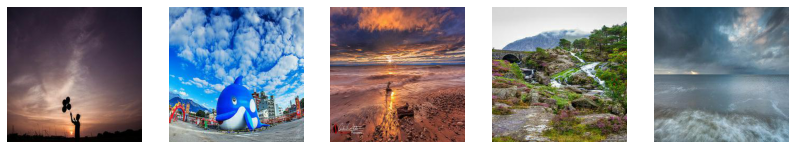

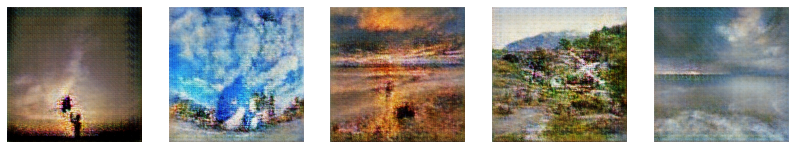

--------------- epoch 2999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.026627488434314728
Generator lr 0.0002 loss: 2.6275642


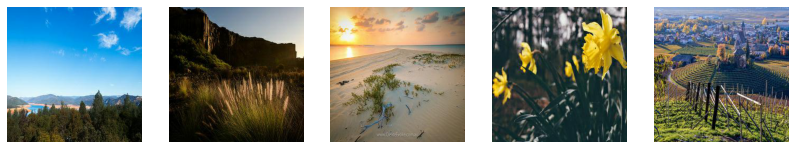

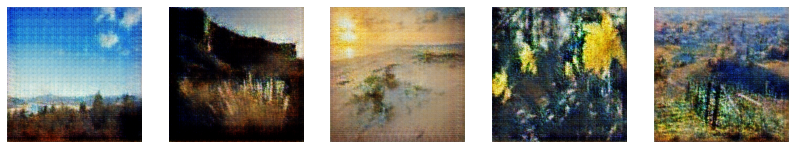

--------------- epoch 3199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.1159631609916687
Generator lr 0.0002 loss: 4.5823817


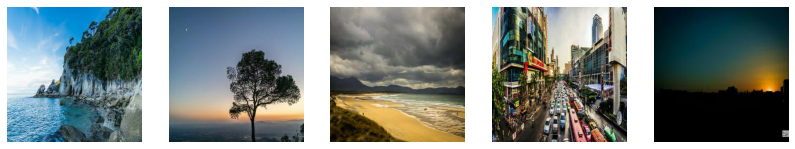

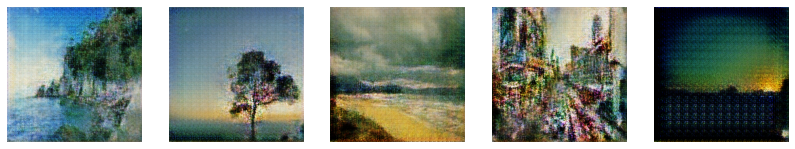

--------------- epoch 3399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.011715766042470932
Generator lr 0.0002 loss: 4.5919447


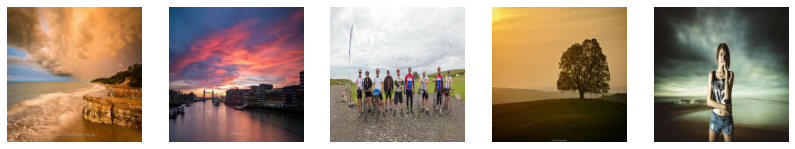

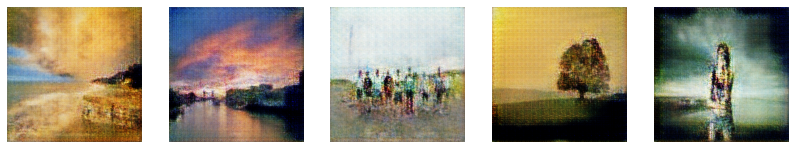

--------------- epoch 3599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.006928711198270321
Generator lr 0.0002 loss: 7.5706525


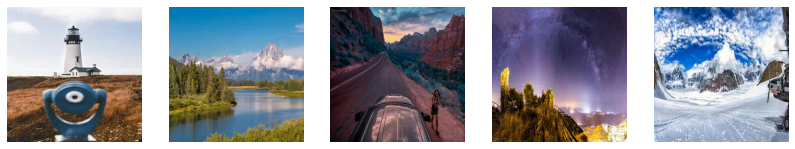

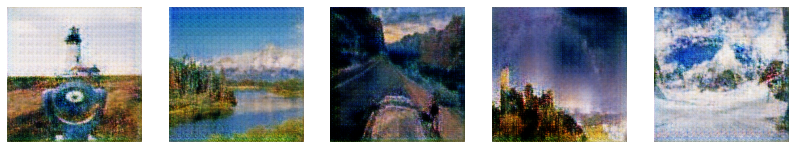

--------------- epoch 3799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.008096903562545776
Generator lr 0.0002 loss: 4.6208086


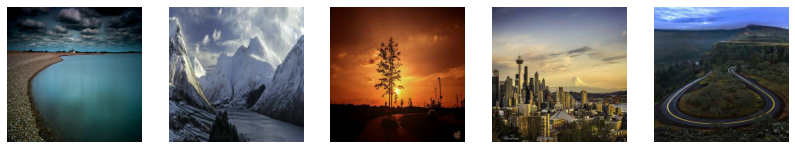

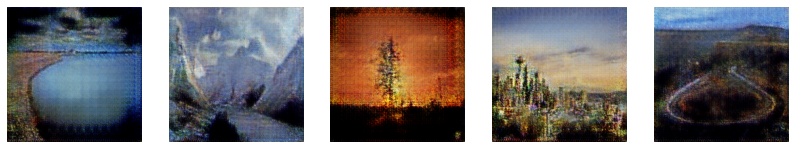

--------------- epoch 3999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.007397308014333248
Generator lr 0.0002 loss: 2.2604094


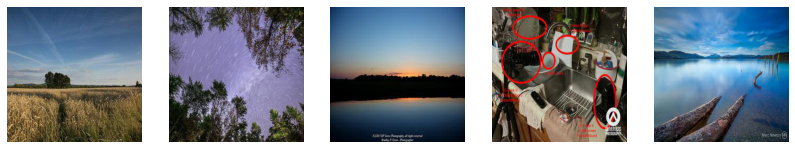

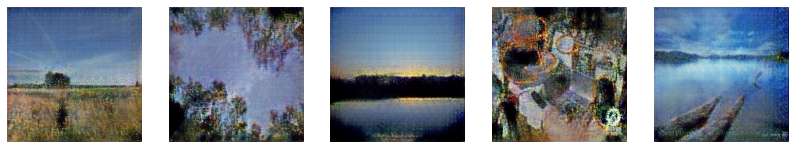

--------------- epoch 4199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.0072174519300460815
Generator lr 0.0002 loss: 5.0536513


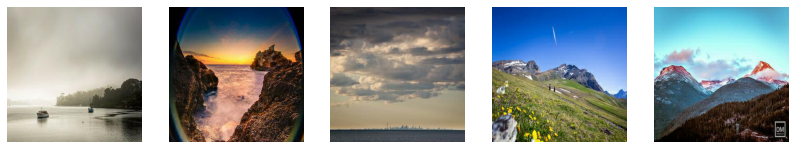

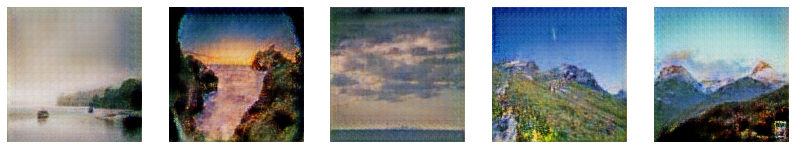

--------------- epoch 4399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.0008130891947075725
Generator lr 0.0002 loss: 2.3364396


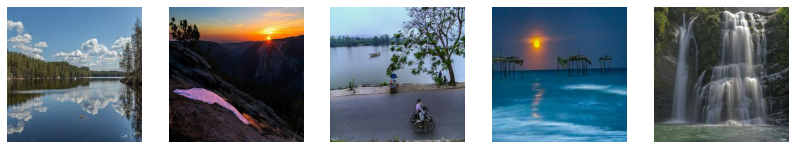

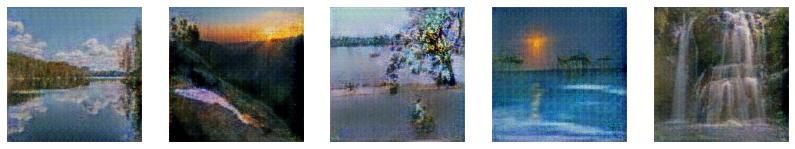

--------------- epoch 4599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.014320841990411282
Generator lr 0.0002 loss: 4.740842


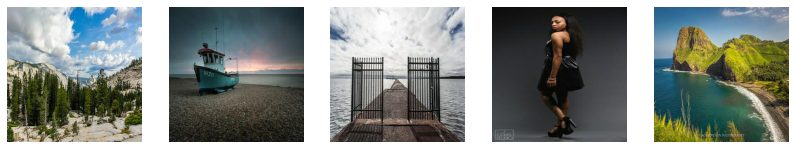

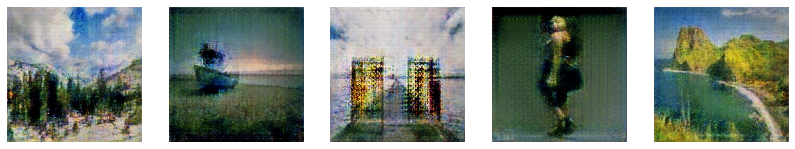

--------------- epoch 4799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.10564043372869492
Generator lr 0.0002 loss: 8.267211


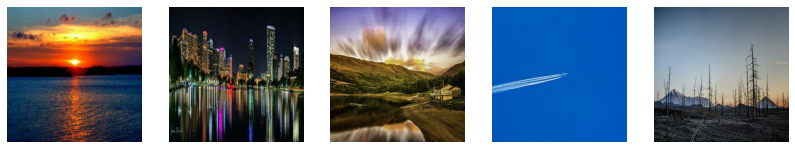

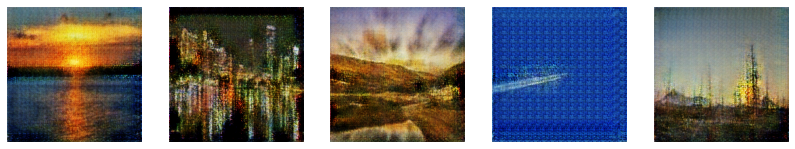

--------------- epoch 4999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.002943803556263447
Generator lr 0.0002 loss: 8.55942


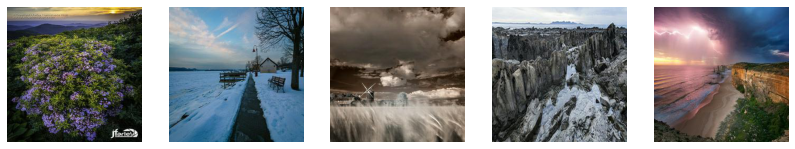

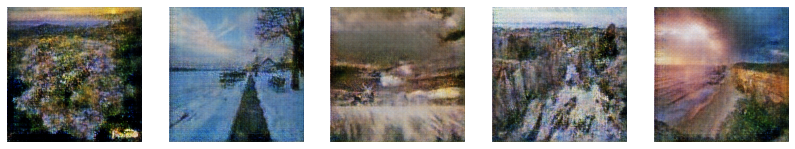

--------------- epoch 5199 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.013171657919883728
Generator lr 0.0002 loss: 6.089134


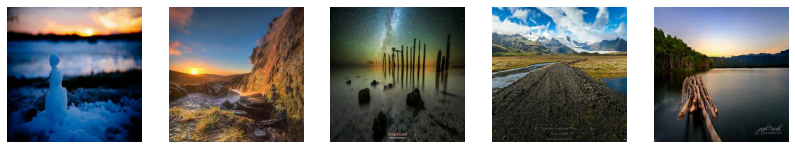

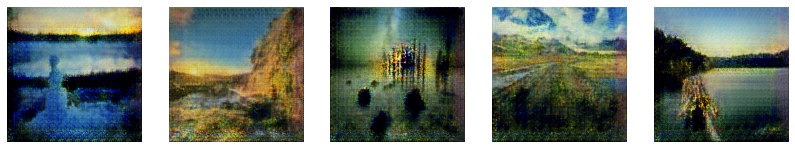

--------------- epoch 5399 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.0026692459359765053
Generator lr 0.0002 loss: 3.101843


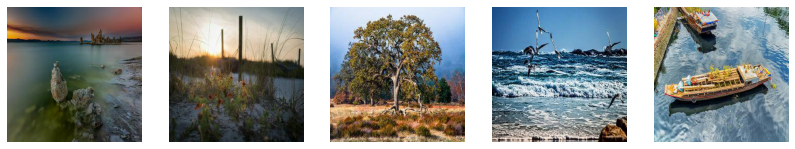

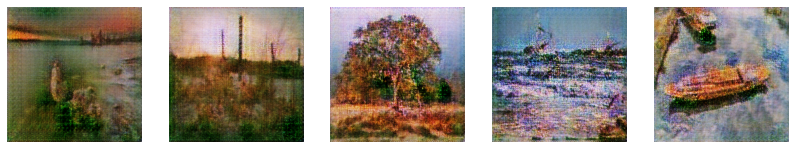

--------------- epoch 5599 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.023375868797302246
Generator lr 0.0002 loss: 8.000776


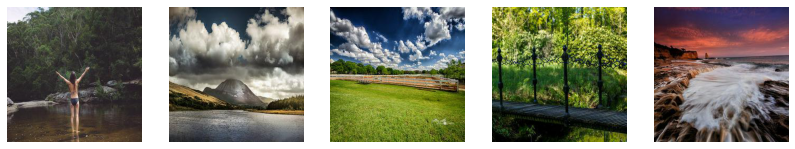

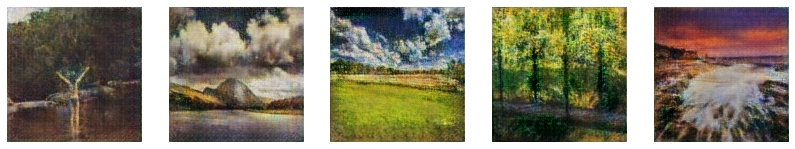

--------------- epoch 5799 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.008732539601624012
Generator lr 0.0002 loss: 5.9268255


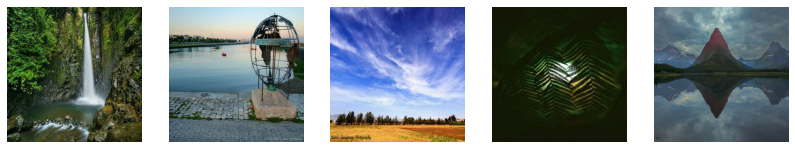

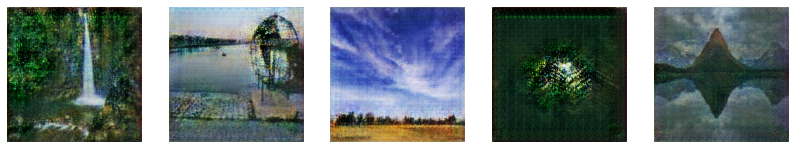

--------------- epoch 5999 ---------------
Discriminator, lr 0.0002 Discriminator loss: 0.0676470473408699
Generator lr 0.0002 loss: 5.923701


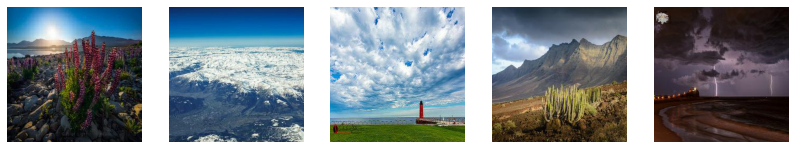

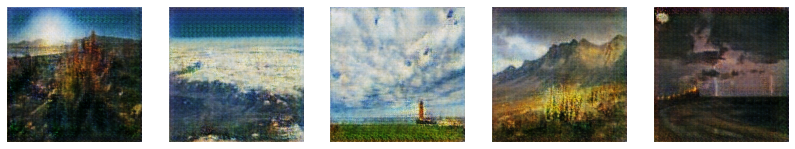

In [25]:
batch_size = 16
epoch_count = 6000
d_loss_list = []
g_loss_list = []
for epoch in range(0, epoch_count):
    imgs,valid,fake= random_get_data(batch_size = batch_size,target = x_train)
    gen_imgs = generator.predict(imgs,batch_size = batch_size)

    discriminator.trainable = True
    d_loss_real = discriminator.train_on_batch(imgs,valid)

    d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
    d_loss = (d_loss_real + d_loss_fake) / 2
    generator.train_on_batch(imgs,imgs)
    
    discriminator.trainable = False
    imgs,valid,fake = random_get_data(batch_size=batch_size,target = x_train)
    g_loss = gan.train_on_batch(imgs, valid)     



    if ((1+epoch)%200)==0:
        dash = "-" * 15
        print(dash, "epoch", epoch, dash)
        print("Discriminator, lr",lr_setting['discriminator']['lr'],"Discriminator loss:", d_loss)
        print("Generator lr",lr_setting['generator']['lr'],"loss:", g_loss)
        d_loss_list.append(d_loss)
        g_loss_list.append(g_loss)
        print_test_result(generator,batch_size=5)
    

## Analysis of the results
- Using the combination of AutoEncoder and GAN, There are two different problems when adjusting parameters:
     1. Too vague: Personal understanding is the result of VAE being too strong and GAN being too weak
     2. Too real and no Monet style: over-fitting
- In order to avoid these two situations, the above are the adjusted optimal parameters, which also shows the training process of model learning.
- Kaggle scores is: 85

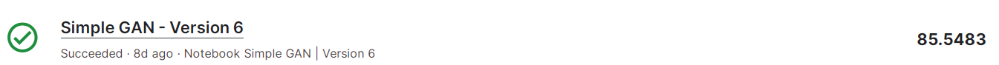

## Kaggle output

In [53]:
batch_size=32
target = x_test.copy()
output_path = 'images/'

try:
    os.makedirs(output_path)
except:
    pass

for t in range(int(len(x_test)/batch_size)+1):
    imgs = []
    if len(target)==0:
            break
    for i in range(batch_size):
        if len(target)==0:
            break
        imgs.append((imread(target.pop())/255))
    imgs = np.array(imgs)

    pic = generator.predict(imgs)
    pic = (pic*255).astype(np.uint8)
    for j in range(len(pic)):
        Image.fromarray(pic[j]).save(output_path+f'{str(t)}_{str(j)}.jpg')

In [50]:
output_path = './images/'

In [51]:
import shutil
shutil.make_archive('./images/', 'zip', output_path)

'E:\\Coursera\\deeplearning\\gan\\monet\\images.zip'

In [52]:
print(f"Generated samples: {len([name for name in os.listdir(output_path) if os.path.isfile(os.path.join(output_path, name))])}")

Generated samples: 7038


##  Conclution
- Generate Monet-style graphs from general photos with GAN.


- GAN consist of at least two neural networks: a generator model and a discriminator model. For this competition, we should generate images in the style of Monet. The generator is trained using the discriminator.

- The two models will play against each other, with the generator trying to fool the discriminator, and the discriminator trying to accurately classify real images from generated images.

- Full convolution: For pictures, full convolution can correctly capture the hidden features of the picture
- Batch Normalization :Each layer has moderate scaling and translation, which can well match the initial weight
- LeakyRelu:We often choose relu as the activation function, but relu will change the slope to 0. This means that the neuron is dead. This will be a disaster in GAN. The improved method here is to use leakyrelu instead, so that the slope of the negative zone is not 0, but a very small value.
- Learning rate = 0.0002 can get the best result that I've tried.
- Using the combination of AutoEncoder and GAN, There are two different problems when adjusting parameters:
     1. Too vague: Personal understanding is the result of VAE being too strong and GAN being too weak
     2. Too real and no Monet style: over-fitting
- In order to avoid these two situations, the above are the adjusted optimal parameters, which also shows the training process of model learning.
- Kaggle scores is: 85
- To improve results:
    1. I will try other deeper GAN variants to get better Kaggle scores, like Cycle Gan.
    2. If the Kaggle score is not the goal, you can try other style transfer algorithms to make the image more monet style.